지도 시각화

In [1]:
import json, folium
import pandas as pd
import numpy as np
from folium import Marker
from folium.plugins import MarkerCluster
import geopandas as gpd
import matplotlib.pyplot as plt

In [13]:
df = pd.read_csv('./제주도 병원 목록.csv')      
df

,병원명,구분,토요일,일요일,공휴일,주소,위도,경도,주소2
0,중문삼성연합의원,의원,1,0,0,제주특별자치도 서귀포시 중문로 7,33.252693,126.423028,중문동
1,조재익신경외과의원,의원,1,0,0,제주특별자치도 서귀포시 대정읍 하모중앙로 76,33.221390,126.251812,대정읍 하모리
2,제주현대안과의원,의원,0,1,0,제주특별자치도 제주시 건주로 31,33.516779,126.580983,도련일동
3,제주필의원,의원,1,0,1,제주특별자치도 제주시 일주동로 229,33.519443,126.569948,화북일동
4,제주연합재활의학과의원,의원,1,0,0,제주특별자치도 제주시 서광로 294,33.500204,126.527884,이도이동
...,...,...,...,...,...,...,...,...,...
492,바로내과의원,의원,1,0,0,제주특별자치도 서귀포시 월드컵로 8,33.248994,126.507323,강정동
493,이승희산부인과의원,의원,1,0,0,제주특별자치도 제주시 서광로 208-1,33.499628,126.518719,삼도일동
494,제주내과의원,의원,1,0,0,제주특별자치도 제주시 서광로 78-9,33.499522,126.505258,오라삼동
495,김동호이비인후과의원,의원,1,0,0,제주특별자치도 제주시 서광로 267,33.500235,126.524945,삼도일동


In [14]:
# folium.Map() 함수 사용하여 지도 객체 생성하기
# df의 위도와 경도 열의 평균값인 위치에 해당하는 지도를 생성하고 확대 수준을 10으로 설정
map=folium.Map(location=[df.위도.mean(), df.경도.mean()], zoom_start=10)
map

In [15]:
# 제주시(blue)-서귀포시(green) 구분해서 folium.Marker
tiles = "http://mt0.google.com/vt/lyrs=m&hl=ko&x={x}&y={y}&z={z}" # 구글지도 타일 설정
attr= "Google" # 속성 설정
map = folium.Map(location=[df['위도'].mean(), df['경도'].mean()], # folium을 사용하여 지도 초기화
                 zoom_start=10, tiles=tiles, attr=attr)
for i in df.index: # df의 각 행을 반복
    if '제주시' in df.loc[i, '주소']:
        folium.Marker(
            location=[df.loc[i, '위도'], df.loc[i, '경도']],
            tooltip=df.loc[i, '병원명'], # 마커에 마우스를 올렸을 때 표시되는 툴팁으로 병원명 표시
            popup=folium.Popup(df.loc[i, '주소'], max_width=200),
            icon=folium.Icon(color='green', icon='glyphicon-plus')
        ).add_to(map)
    else:
        folium.Marker(
            location=[df.loc[i, '위도'], df.loc[i, '경도']],
            tooltip=df.loc[i, '병원명'], # 마커에 마우스를 올렸을 때 표시되는 툴팁으로 병원명 표시
            popup=folium.Popup(df.loc[i, '주소'], max_width=200),
            icon=folium.Icon(color='blue', icon='glyphicon-plus')
        ).add_to(map)

In [15]:
map

MarkerCluster

In [17]:
# 마커 클러스터링, 미니맵 사용을 위해 라이브러리 추가
from folium.plugins import MarkerCluster
from folium.plugins import MiniMap

tiles = "http://mt0.google.com/vt/lyrs=m&hl=ko&x={x}&y={y}&z={z}" # 구글지도 타일 설정
attr= "Google" #속성 설정
map = folium.Map(location=[df['위도'].mean(), df['경도'].mean()], # folium을 사용하여 지도 초기화
                 zoom_start=10, tiles=tiles, attr=attr)

# 마커 클러스터 추가하기
marker_cluster = MarkerCluster().add_to(map)  

# 미니맵 추가하기
minimap = MiniMap()
minimap.add_to(map)

# 위치 하나씩 추가하기
for i in df.index:
    name = df.loc[i, '병원명']
    lon = df.loc[i, '경도']  # 경도
    lat = df.loc[i, '위도']   # 위도
    folium.Marker([lat, lon],tooltip= name).add_to(marker_cluster)

In [19]:
map

단계구분도 (Choropleth Map)

In [48]:
import geopandas as gpd # 지리 공간 데이터를 다루기 위한 파이썬 라이브러리

# shapefile 불러오기
file_path = 'C:/workspace/프로젝트/_census_data_2023_bnd_dong_bnd_dong_39_2023_2023/bnd_dong_39_2023_2023_2Q.shp'
geo_data = gpd.read_file(file_path, encoding='utf-8')

# 데이터 확인
print(geo_data.head())

  BASE_DATE ADM_NM    ADM_CD  \
0  20230701    우도면  39010330   
1  20230701   일도2동  39010520   
2  20230701   이도1동  39010530   
3  20230701   이도2동  39010540   
4  20230701    외도동  39010670   

                                            geometry  
0  MULTIPOLYGON (((950424.252 1499895.844, 950423...  
1  POLYGON ((910816.890 1502861.737, 910867.680 1...  
2  POLYGON ((909507.955 1502779.303, 909509.162 1...  
3  POLYGON ((910895.120 1501703.575, 910936.065 1...  
4  MULTIPOLYGON (((899697.433 1500634.414, 899698...  


In [50]:
plt.rcParams["font.family"] = 'NanumGothic' # 한글폰트
plt.rcParams["figure.figsize"] = (10,10)

file_path = 'C:/workspace/프로젝트/_census_data_2023_bnd_dong_bnd_dong_39_2023_2023/bnd_dong_39_2023_2023_2Q.shp'
geo_data = gpd.read_file(file_path, encoding='utf-8')
geo_data

# BASE_DATE: 기준 날짜, ADM_NM: 읍면동 이름, ADM_CD: 읍명동 코드, geometry: 지리데이터의 공간 정보

,BASE_DATE,ADM_NM,ADM_CD,geometry
0,20230701,우도면,39010330,"MULTIPOLYGON (((950424.252 1499895.844, 950423..."
1,20230701,일도2동,39010520,"POLYGON ((910816.890 1502861.737, 910867.680 1..."
2,20230701,이도1동,39010530,"POLYGON ((909507.955 1502779.303, 909509.162 1..."
3,20230701,이도2동,39010540,"POLYGON ((910895.120 1501703.575, 910936.065 1..."
4,20230701,외도동,39010670,"MULTIPOLYGON (((899697.433 1500634.414, 899698..."
5,20230701,이호동,39010680,"MULTIPOLYGON (((902498.911 1501641.583, 902496..."
6,20230701,도두동,39010690,"MULTIPOLYGON (((904051.683 1502375.543, 904050..."
7,20230701,서홍동,39020580,"POLYGON ((909727.287 1481146.109, 909749.535 1..."
8,20230701,대륜동,39020590,"MULTIPOLYGON (((908207.178 1469892.602, 908205..."
9,20230701,대천동,39020600,"MULTIPOLYGON (((907092.035 1470884.232, 907090..."


In [54]:
geo_data.keys()

Index(['BASE_DATE', 'ADM_NM', 'ADM_CD', 'geometry'], dtype='object')

In [55]:
geo_data['ADM_NM'][0]

'우도면'

In [73]:
# 단계구분도

center = [33.4996, 126.5312] # 제주도의 중심 좌표 설정
map = folium.Map(location=center, zoom_start=10) # 지도 초기화

folium.Choropleth(
    geo_data=geo_data,
    data=df.병원수, # 데이터프레임 전체 사용 
    columns=['ADM_NM', '병원수'], # GeoJSON 데이터와 매핑할 데이터의 열
    key_on='feature.properties.ADM_NM', # GeoJSON 데이터에서 각 피처를 식별하는데 사용되는 키
    fill_color='BuPu', # 데이터 값을 색상으로 표현할 때 사용되는 팔레트

    fill_opacity=1.0,  # 영역의 색상 투명도
    line_opacity=0.2,  # 경계선의 투명도
    legend_name='제주 읍면동별 병의원 분포' # 범례
).add_to(map)

map

파이차트 (Pie Chart)

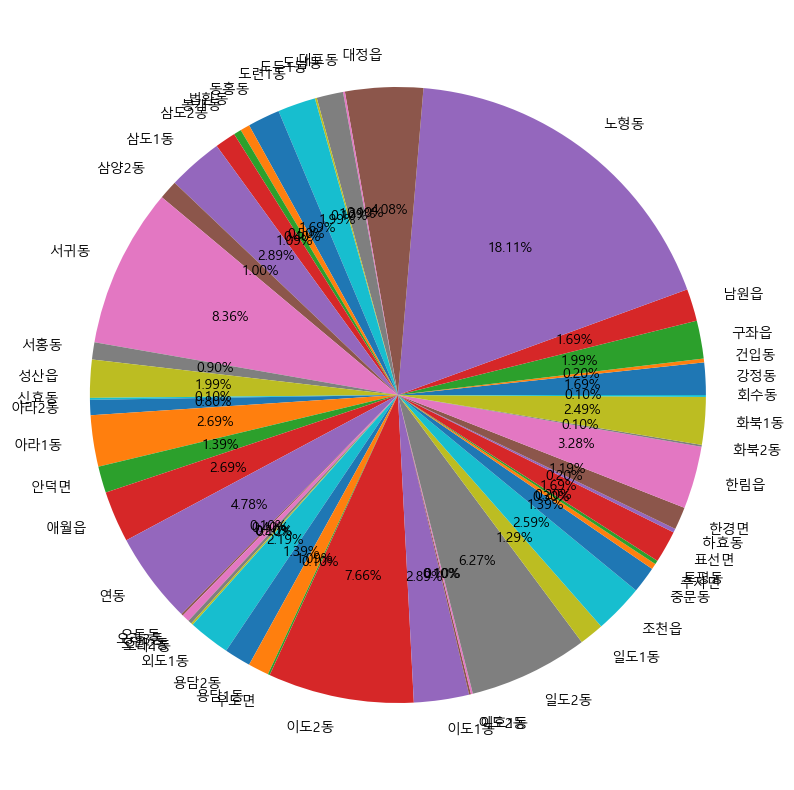

In [136]:
# 제주도 병원 전체 파이차트(원그래프)
plt.rcParams["font.family"] = 'Malgun Gothic' # 한글폰트
plt.rcParams["figure.figsize"] = (10,10) # 그래픽 크기 설정

ratio = [1.69,0.20,1.99,1.69,18.11,4.08,0.10,1.39,0.10,1.99,1.69,0.50,0.40,1.09,2.89,1.00,8.36,0.90,1.99,0.10,0.80,2.69,1.39,2.69,4.78,0.10,0.40,0.20,0.10,2.19,1.39,1.09,0.10,7.66,2.89,0.10,0.10,6.27,1.29,2.59,1.39,0.30,0.20,1.69,0.20,1.19,3.28,0.10,2.49,0.10]
labels = ['강정동','건입동','구좌읍','남원읍','노형동','대정읍','대포동','도남동','도두1동','도련1동','동홍동','법환동','봉개동','삼도2동','삼도1동','삼양2동','서귀동','서홍동','성산읍','신효동','아라2동','아라1동','안덕면','애월읍','연동','오등동','오라3동','오라2동','오라1동','외도1동','용담2동','용담1동','우도면','이도2동','이도1동','이도2동','이호1동','일도2동','일도1동','조천읍','중문동','추자면','토평동','표선면','하효동','한경면','한림읍','화북2동','화북1동','회수동']

plt.pie(ratio, labels=labels, autopct='%.2f%%')
plt.show()

Text(0.5, 1.0, '제주 읍면동별 병의원 분포')

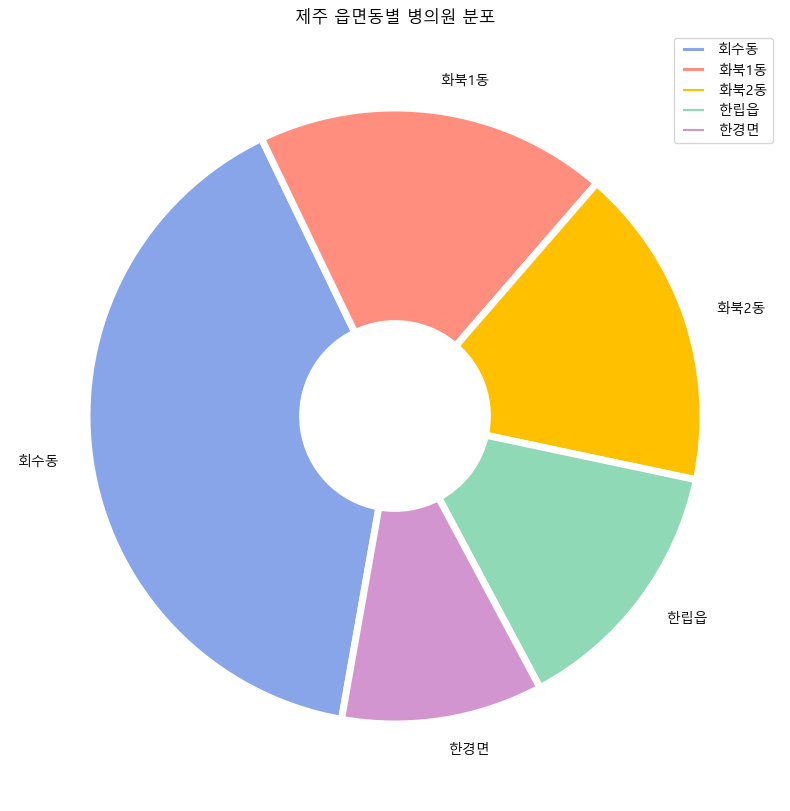

In [157]:
#제주도 병원 TOP5 파이차트(원그래프)
plt.rcParams["font.family"] = 'Malgun Gothic' #한글폰트
plt.rcParams["figure.figsize"] = (10,10) #그래픽 크기 설정

ratio = [18.11, 8.36, 7.66, 6.27, 4.78]
labels = ['회수동','화북1동','화북2동','한립읍','한경면']
colors = ['#89a5ea','#ff8e7f', '#ffc000', '#8fd9b6', '#d395d0']
wedgeprops={'width': 0.7, 'edgecolor': 'w', 'linewidth': 5}

plt.pie(ratio, labels=labels, startangle=260,counterclock=False, colors=colors, wedgeprops=wedgeprops)

plt.legend(labels)
plt.title('제주 읍면동별 병의원 분포')